In [ ]:
folder_name = "/content/drive/My Drive/Colab Notebooks/Shopee_sample_data/Adult_Klasifikasi"

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import sys
sys.path.append(f'{folder_name}')

Mounted at /content/drive


In [ ]:
# Mengimpor Library yang Diperlukan untuk Analisis Data dan Model Machine Learning
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nbformat.v4 import new_markdown_cell

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score
import joblib
from wordcloud import WordCloud

pd.set_option('display.max_columns', None)

In [ ]:
# bisa juga dari folder google drive

column_names = ['price_ori', 'delivery', 'item_category_detail',
                'specification', 'title', 'w_date', 'link_ori',
                'item rating', 'seller_name', 'idElastic', 'price_actual',
                'sitename', 'idHast', 'total_rating', 'id', 'total_sold',
                'pict_link', 'favorite', 'timestamp', 'desc'];

df =pd.read_csv(f'{folder_name}/20240121_shopee_sample_data (1).csv', sep=',',names=column_names, skipinitialspace=True, na_values="?")

# Tampilkan beberapa baris pertama dan informasi dataset
df.head(5)

,price_ori,delivery,item_category_detail,specification,title,w_date,link_ori,item rating,seller_name,idElastic,price_actual,sitename,idHast,total_rating,id,total_sold,pict_link,favorite,timestamp,desc
0,price_ori,delivery,item_category_detail,specification,title,w_date,link_ori,item_rating,seller_name,idElastic,price_actual,sitename,idHash,total_rating,id,total_sold,pict_link,favorite,timestamp,desc
1,25.80,"KL City, Kuala Lumpur",Shopee | Women's Bags | Shoulder Bags | Should...,Product Specifications Category Shopee Women's...,1081 PU SLING BAG KULIT leather Casual Beg Tan...,2023-04-27,https://shopee.com.my/1081-PU-SLING-BAG-KULIT-...,4.9,qqfwholesale,19ec9fdedd9fe3e14bc652950fc3c423,12.90,shopee,88f051f0a2dcf0d29191e0175b828938,179,88f051f0a2dcf0d29191e0175b828938,179,https://down-my.img.susercontent.com/file/my-1...,Favorite (128,1682553600000,🎉 WELCOME To QQF WHOLESALE \r\n😍 ALL item read...
2,1.41,NaN,Shopee | Home Appliances | Sewing Machines | S...,Product Specifications Category Shopee Home Ap...,Stat Chinese Traditional Frog Buttons Knot Che...,2023-04-27,https://shopee.com.my/Stat-Chinese-Traditional...,5.0,stationery.my,5322309be3b6d9c01d15fa19f5b7ad9a,0.75,shopee,472d22f58af3bb35cf28c6eed7088dc5,17,472d22f58af3bb35cf28c6eed7088dc5,17,https://down-my.img.susercontent.com/file/4147...,Favorite (19,1682553600000,Chinese Traditional Frog Buttons Knot Cheongsa...
3,8.50,"KL City, Kuala Lumpur",Shopee | Women's Bags | Handbags | Set Handbags,Product Specifications Category Shopee Women's...,N09 READY STOCK MYFOOYIN woman handbag set 2in...,2023-04-26,https://shopee.com.my/N09-READY-STOCK-MYFOOYIN...,4.9,fooyin88,7a36765d1e2ca2b6a5414ddfeedfefc3,8.50,shopee,ec6ce64f4b77efb38b6392818959f181,8.1k,ec6ce64f4b77efb38b6392818959f181,8.1k,https://down-my.img.susercontent.com/file/23da...,Favorite (21.5k,1682467200000,READY STOCK\nMEASUREMENT:\nLONG 26CM X HEIGHT ...
4,8.70,NaN,Shopee | Women Clothes | Maternity Wear | Inne...,Product Specifications Category Shopee Women C...,🔥Shocking Sale🔥Cotton Comfort Nursing Bra Brea...,2023-04-26,https://shopee.com.my/%F0%9F%94%A5Shocking-Sal...,4.9,vivi2002,7fc4ab69722e4f788f217b4c044f83eb,8.70,shopee,ef4e0e17fdc7d0125d8609dcc395bc3d,6.5k,ef4e0e17fdc7d0125d8609dcc395bc3d,6.5k,https://down-my.img.susercontent.com/file/df47...,Favorite (3.4k,1682467200000,PRODUCT DESCRIPTION\nMaterial:95%Cotton+5%Span...


In [ ]:
# 3️⃣ Info kolom
print("\n📝 Info Data:")
print(df.info())


📝 Info Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20313 entries, 0 to 20312
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   price_ori             20113 non-null  object
 1   delivery              6559 non-null   object
 2   item_category_detail  20313 non-null  object
 3   specification         20302 non-null  object
 4   title                 20313 non-null  object
 5   w_date                20313 non-null  object
 6   link_ori              20313 non-null  object
 7   item rating           20302 non-null  object
 8   seller_name           20302 non-null  object
 9   idElastic             20313 non-null  object
 10  price_actual          20298 non-null  object
 11  sitename              20313 non-null  object
 12  idHast                20313 non-null  object
 13  total_rating          20302 non-null  object
 14  id                    20313 non-null  object
 15  total_sold            

In [ ]:
# 4️⃣ Statistik deskriptif
print("\n📊 Statistik Deskriptif:")
print(df.describe())


📊 Statistik Deskriptif:
       price_ori               delivery  \
count      20113                   6559   
unique      2965                      2   
top         1.00  KL City, Kuala Lumpur   
freq         543                   6558   

                                     item_category_detail  \
count                                               20313   
unique                                               1153   
top     Shopee | Mobile & Accessories | Tablets | Andr...   
freq                                                  203   

                                            specification  \
count                                               20302   
unique                                              19265   
top     Product Specifications Category Shopee Automot...   
freq                                                   12   

                                                    title      w_date  \
count                                               20313       20313   
u

In [ ]:
# 5️⃣ Cek missing values
print("\n❗ Missing Values:")
print(df.isnull().sum())


❗ Missing Values:
price_ori                 200
delivery                13754
item_category_detail        0
specification              11
title                       0
w_date                      0
link_ori                    0
item rating                11
seller_name                11
idElastic                   0
price_actual               15
sitename                    0
idHast                      0
total_rating               11
id                          0
total_sold                 11
pict_link                   0
favorite                 1070
timestamp                   0
desc                        0
dtype: int64


In [ ]:
# 6️⃣ Contoh membersihkan harga
# Misal kolom harga bernama 'Price'
if 'Price' in df.columns:
    df['Price_Clean'] = (
        df['Price']
        .replace('[Rp,]', '', regex=True)
        .replace('\.', '', regex=True)
        .astype(float)
    )

In [ ]:
# 7️⃣ Plot distribusi harga
if 'Price_Clean' in df.columns:
    plt.figure(figsize=(10,6))
    sns.histplot(df['Price_Clean'], bins=30, kde=True, color='skyblue')
    plt.title("Distribusi Harga Produk")
    plt.xlabel("Harga (IDR)")
    plt.ylabel("Jumlah Produk")
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠️ Kolom 'Price' tidak ditemukan, distribusi harga tidak bisa diplot.")


⚠️ Kolom 'Price' tidak ditemukan, distribusi harga tidak bisa diplot.


In [ ]:
# 8️⃣ Plot top 10 kategori (jika ada kolom 'Category')
if 'Category' in df.columns:
    top_categories = df['Category'].value_counts().head(10)
    plt.figure(figsize=(10,6))
    sns.barplot(y=top_categories.index, x=top_categories.values, palette='viridis')
    plt.title("10 Kategori Produk Terbanyak")
    plt.xlabel("Jumlah Produk")
    plt.ylabel("Kategori")
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠️ Kolom 'Category' tidak ditemukan, chart kategori tidak bisa diplot.")


⚠️ Kolom 'Category' tidak ditemukan, chart kategori tidak bisa diplot.


In [ ]:
# 9️⃣ Simpan data bersih ke file baru
df.to_csv("shopee_cleaned_data.csv", index=False)
print("\n✅ Data bersih sudah disimpan ke 'shopee_cleaned_data.csv'")


✅ Data bersih sudah disimpan ke 'shopee_cleaned_data.csv'


In [ ]:
# 10️⃣ Download file bersih
from google.colab import files
files.download("shopee_cleaned_data.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# PIE CHART Top 5 Lokasi Toko
if 'Location' in df.columns:
    top_locations = df['Location'].value_counts().head(5)
    plt.figure(figsize=(7,7))
    plt.pie(
        top_locations.values,
        labels=top_locations.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette('pastel')[0:5]
    )
    plt.title("Distribusi Top 5 Lokasi Toko")
    plt.show()
else:
    print("⚠️ Kolom 'Location' tidak ditemukan.")

⚠️ Kolom 'Location' tidak ditemukan.


In [ ]:
# TIME SERIES Jumlah Produk Per Tanggal Upload (jika ada kolom 'Date')
if 'Date' in df.columns:
    # Pastikan kolom Date dalam format datetime
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df_time = df.groupby(df['Date'].dt.date).size()
    plt.figure(figsize=(12,6))
    df_time.plot(marker='o')
    plt.title("Jumlah Produk per Tanggal")
    plt.xlabel("Tanggal")
    plt.ylabel("Jumlah Produk")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Kolom 'Date' tidak ditemukan.")

⚠️ Kolom 'Date' tidak ditemukan.


In [ ]:
!pip install wordcloud

In [ ]:
# Gabungkan semua judul jadi satu teks panjang
if 'ProductName' in df.columns:
    all_text = " ".join(df['ProductName'].astype(str))

    # Buat word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=100
    ).generate(all_text)

    # Tampilkan
    plt.figure(figsize=(15,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Word Cloud Judul Produk")
    plt.show()
else:
    print("⚠️ Kolom 'ProductName' tidak ditemukan.")

⚠️ Kolom 'ProductName' tidak ditemukan.


In [ ]:
# Gabungkan semua judul jadi satu teks panjang
if 'ProductName' in df.columns:
    all_text = " ".join(df['ProductName'].astype(str))

    # Buat word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='viridis',
        max_words=100
    ).generate(all_text)

    # Tampilkan
    plt.figure(figsize=(15,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Word Cloud Judul Produk")
    plt.show()
else:
    print("⚠️ Kolom 'ProductName' tidak ditemukan.")

⚠️ Kolom 'ProductName' tidak ditemukan.


In [ ]:
# Pastikan harga sudah dibersihkan
if 'price_actual' in df.columns:
    # Convert 'price_actual' and 'item rating' to numeric, coercing errors
    df['Price_Clean'] = pd.to_numeric(df['price_actual'], errors='coerce')
    df['Rating'] = pd.to_numeric(df['item rating'], errors='coerce')

    # Filter the DataFrame
    filtered_df = df[
        (df['Price_Clean'] >= 100000) &
        (df['Rating'] >= 4.5) &
        (df['item_category_detail'].str.contains("Pakaian Pria", na=False)) # Using item_category_detail and checking for "Pakaian Pria"
    ]

    print(f"✅ Jumlah produk sesuai filter: {len(filtered_df)}")
    display(filtered_df.head())

    # Simpan hasil filter ke CSV
    filtered_df.to_csv("shopee_filtered_data.csv", index=False)
    print("\n✅ Data bersih sudah disimpan ke 'shopee_filtered_data.csv'")

else:
    print("⚠️ Kolom 'price_actual' tidak ditemukan, filtering tidak bisa dilakukan.")

✅ Jumlah produk sesuai filter: 0


,price_ori,delivery,item_category_detail,specification,title,w_date,link_ori,item rating,seller_name,idElastic,price_actual,sitename,idHast,total_rating,id,total_sold,pict_link,favorite,timestamp,desc,Price_Clean,Rating



✅ Data bersih sudah disimpan ke 'shopee_filtered_data.csv'


In [ ]:
# Filter kriteria baru
kategori_pilihan = "Elektronik"   # Ganti sesuai keinginan
harga_min = 500000                # Ganti sesuai kebutuhan
rating_min = 4.0

if 'Price_Clean' in df.columns:
    filtered_df = df[
        (df['Price_Clean'] >= harga_min) &
        (df['Rating'] >= rating_min) &
        (df['item_category_detail'].str.contains(kategori_pilihan, na=False)) # Use item_category_detail and check for the chosen category
    ]

    print(f"✅ Jumlah produk kategori '{kategori_pilihan}' dengan harga >= {harga_min} dan rating >= {rating_min}: {len(filtered_df)}")
    print(filtered_df.head())

    # Simpan hasil filter
    filtered_df.to_csv("shopee_filtered_custom.csv", index=False)

    # Download file
    from google.colab import files
    files.download("shopee_filtered_custom.csv")
else:
    print("⚠️ Kolom 'Price_Clean' belum ada.")

✅ Jumlah produk kategori 'Elektronik' dengan harga >= 500000 dan rating >= 4.0: 0
Empty DataFrame
Columns: [price_ori, delivery, item_category_detail, specification, title, w_date, link_ori, item rating, seller_name, idElastic, price_actual, sitename, idHast, total_rating, id, total_sold, pict_link, favorite, timestamp, desc, Price_Clean, Rating]
Index: []


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/tmp/ipython-input-52-2021395885.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


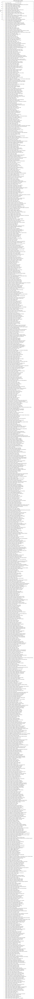

In [ ]:
if 'Price_Clean' in df.columns and 'Rating' in df.columns:
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        data=df,
        x='Price_Clean',
        y='Rating',
        hue='item_category_detail', # Changed 'Category' to 'item_category_detail'
        alpha=0.6,
        palette='Set2'
    )
    plt.title("Scatter Plot Harga vs Rating")
    plt.xlabel("Harga Produk (IDR)")
    plt.ylabel("Rating")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Kolom 'Price_Clean' atau 'Rating' belum ada.")

In [ ]:
if 'Price_Clean' in df.columns:
    top_expensive = df.sort_values(by='Price_Clean', ascending=False).head(5)
    print("💰 5 Produk Termahal:")
    print(top_expensive[['title','item_category_detail','Price_Clean','Rating']])

💰 5 Produk Termahal:
                                                   title  \
8169            荣富 永远的神，多功能卡拉OK机器，会教数学 | Shopee Malaysia   
8677            荣富 永远的神，多功能卡拉OK机器，会教数学 | Shopee Malaysia   
10287  Free Gift x 1 - Thank you for support (Not for...   
15513  [CARSOME] 2016  Toyota Vellfire 2.5 Auto - Boo...   
10606  [CARSOME] 2016  Toyota Vellfire 2.5 Auto - Boo...   

                                    item_category_detail  Price_Clean  Rating  
8169   Shopee | Home Appliances | Landline Phones | C...  999999999.0     NaN  
8677   Shopee | Home Appliances | Landline Phones | C...  999999999.0     NaN  
10287         Shopee | Home Appliances | Others | Others    1000000.0     4.8  
15513                  Shopee | Automotive | Automobiles     205500.0     NaN  
10606                  Shopee | Automotive | Automobiles     205500.0     NaN  


In [ ]:
# PIE CHART per kategori
if 'Category' in df.columns:
    kategori_counts = df['Category'].value_counts()
    plt.figure(figsize=(8,8))
    plt.pie(
        kategori_counts.values,
        labels=kategori_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette('pastel')[0:len(kategori_counts)]
    )
    plt.title("Distribusi Produk per Kategori")
    plt.axis('equal')
    plt.show()
else:
    print("⚠️ Kolom 'Category' tidak ditemukan.")


⚠️ Kolom 'Category' tidak ditemukan.


In [ ]:
from textblob import TextBlob

if 'Review' in df.columns:
    # Fungsi hitung polaritas
    def get_sentiment(text):
        return TextBlob(str(text)).sentiment.polarity

    df['Sentiment'] = df['Review'].apply(get_sentiment)

    # Kategorisasi Sentimen
    df['Sentiment_Label'] = df['Sentiment'].apply(lambda x:
        'Positive' if x > 0 else ('Negative' if x < 0 else 'Neutral'))

    print("✅ Contoh hasil analisis sentimen:")
    print(df[['Review','Sentiment','Sentiment_Label']].head())

    # Visualisasi distribusi sentimen
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x='Sentiment_Label', palette='Set2')
    plt.title("Distribusi Sentimen Ulasan")
    plt.xlabel("Sentimen")
    plt.ylabel("Jumlah")
    plt.show()
else:
    print("⚠️ Kolom 'Review' tidak ditemukan.")


⚠️ Kolom 'Review' tidak ditemukan.


In [ ]:
import plotly.express as px

if 'Price_Clean' in df.columns and 'Rating' in df.columns:
    fig = px.scatter(
        df,
        x='Price_Clean',
        y='Rating',
        color='item_category_detail', # Changed 'Category' to 'item_category_detail'
        hover_data=['title'], # Changed 'ProductName' to 'title'
        title='Scatter Plot Interaktif: Harga vs Rating'
    )
    fig.show()

    fig_hist = px.histogram(
        df,
        x='Price_Clean',
        nbins=50,
        title='Distribusi Harga Produk'
    )
    fig_hist.show()
else:
    print("⚠️ Kolom 'Price_Clean' atau 'Rating' belum tersedia.")

In [ ]:
# Hilangkan duplikat
df_clean = df.drop_duplicates()

# Hilangkan baris yang harga atau rating kosong
if 'Price_Clean' in df_clean.columns and 'Rating' in df_clean.columns:
    df_clean = df_clean.dropna(subset=['Price_Clean', 'Rating'])

# Reset index
df_clean = df_clean.reset_index(drop=True)

print("✅ Data setelah pembersihan lebih dalam:")
print(df_clean.head())

# Simpan data bersih
df_clean.to_csv("shopee_cleaned_deep.csv", index=False)

# Download file
from google.colab import files
files.download("shopee_cleaned_deep.csv")


✅ Data setelah pembersihan lebih dalam:
  price_ori               delivery  \
0     25.80  KL City, Kuala Lumpur   
1      1.41                    NaN   
2      8.50  KL City, Kuala Lumpur   
3      8.70                    NaN   
4   3999.00  KL City, Kuala Lumpur   

                                item_category_detail  \
0  Shopee | Women's Bags | Shoulder Bags | Should...   
1  Shopee | Home Appliances | Sewing Machines | S...   
2    Shopee | Women's Bags | Handbags | Set Handbags   
3  Shopee | Women Clothes | Maternity Wear | Inne...   
4   Shopee | Cameras & Drones | DSLR Cameras | DSLRs   

                                       specification  \
0  Product Specifications Category Shopee Women's...   
1  Product Specifications Category Shopee Home Ap...   
2  Product Specifications Category Shopee Women's...   
3  Product Specifications Category Shopee Women C...   
4  Product Specifications Category Shopee Cameras...   

                                               title     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>